First Variation 


Installation and imports


In [1]:
!pip install librosa

In [2]:
import librosa
from librosa.core.audio import zero_crossings
import librosa.display

import numpy as np
import IPython.display as ipd

%matplotlib inline
import matplotlib.pyplot as plt

import sklearn

End of Installation

In [3]:
audio_file="/content/drive/MyDrive/Colab Notebooks/ML/Course Work/al-90-5-min-of-lethargic-slumber.mp3"
x, sr = librosa.load(audio_file)

print (type(x), type(sr))

print(x.shape, sr)

#This returns an audio time series as a numpy array with a default sampling rate(sr) of 22KHZ mono.

/usr/local/lib/python3.7/dist-packages/librosa/core/audio.py:165: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn("PySoundFile failed. Trying audioread instead.")


<class 'numpy.ndarray'> <class 'int'>
(6618816,) 22050


In [4]:
ipd.Audio(audio_file)


We can plot the audio array using librosa.display.waveplot:

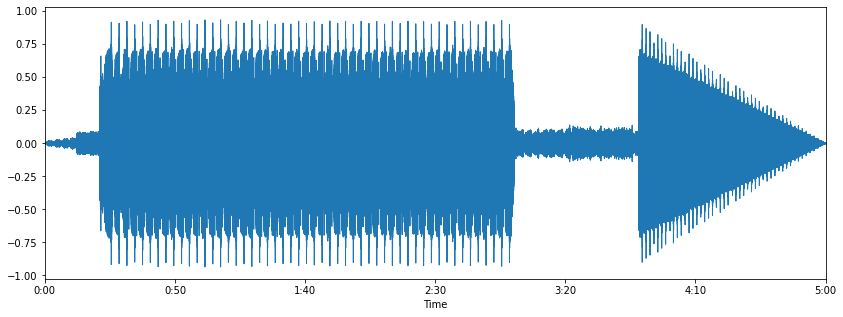

In [5]:
plt.figure(figsize=(14,5))
librosa.display.waveplot(x, sr=sr)



Zero Crossing Rate

The zero crossing rate is the rate of sign-changes along a signal, i.e., the rate at which the signal changes from positive to negative or back. This feature has been used heavily in both speech recognition and music information retrieval. It usually has higher values for highly percussive sounds like those in metal and rock.
Let us calculate the zero crossing rate for our example audio clip.

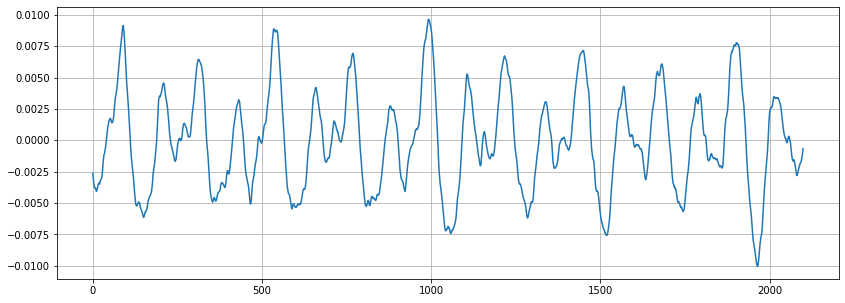

In [6]:
n0 = 7000
n1 = 9100 

plt.figure(figsize=(14,5))
plt.plot(x[n0:n1])
plt.grid()

Let's count number of zero crossings

In [7]:
crossings_0 = zero_crossings(x[n0:n1], pad=False)
print(sum(crossings_0))

48


A spectrogram is a visual representation of the spectrum of frequencies of sound or other signals as they vary with time. Spectrograms are sometimes called sonographs, voiceprints, or voicegrams. When the data is represented in a 3D plot, they may be called waterfalls. In 2-dimensional arrays, the first axis is frequency while the second axis is time.
We can display a spectrogram using. librosa.display.specshow.

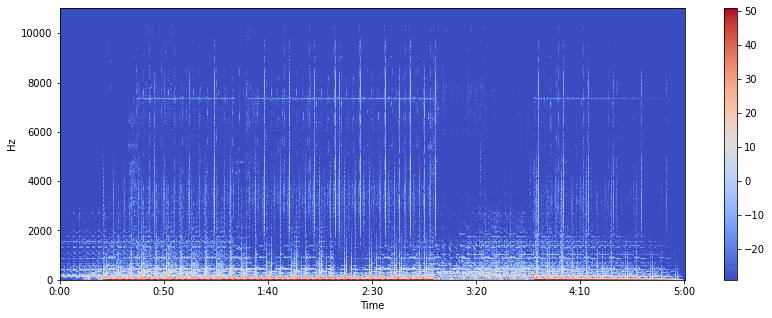

In [8]:
X = librosa.stft(x)
Xdb = librosa.amplitude_to_db(abs(X))

plt.figure(figsize=(14,5))
librosa.display.specshow(Xdb, sr=sr, x_axis='time', y_axis='hz')
plt.colorbar()


The vertical axis shows frequencies (from 0 to 10kHz), and the horizontal axis shows the time of the clip. Since we see that all action is taking place at the bottom of the spectrum, we can convert the frequency axis to a logarithmic one.

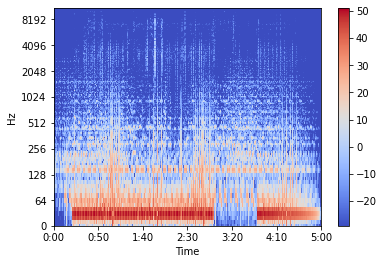

In [9]:
librosa.display.specshow(Xdb,sr=sr, x_axis='time', y_axis='log')
plt.colorbar()

Spectral Centroid

It indicates where the ”centre of mass” for a sound is located and is calculated as the weighted mean of the frequencies present in the sound. Consider two songs, one from a blues genre and the other belonging to metal. Now as compared to the blues genre song which is the same throughout its length, the metal song has more frequencies towards the end. So spectral centroid for blues song will lie somewhere near the middle of its spectrum while that for a metal song would be towards its end.
librosa.feature.spectral_centroid computes the spectral centroid for each frame in a signal:

(12928,)


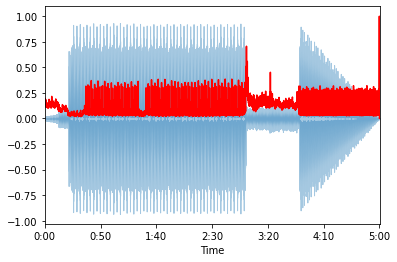

In [10]:
spectral_centroids = librosa.feature.spectral_centroid(x, sr=sr)[0]
print(spectral_centroids.shape)

#Computing the time variable for Visualisation
frames = range(len(spectral_centroids))
t = librosa.frames_to_time(frames)

#Normalising the spectral centroid for Visualisation
def normalise(x, axis=0):
  return sklearn.preprocessing.minmax_scale(x, axis=axis)

#Plotting the Spectral Centroid along the waveform
librosa.display.waveplot(x, sr=sr, alpha=0.4)
plt.plot(t, normalise(spectral_centroids), color='r')


There is a rise in the spectral centroid towards the end.

Spectral Rolloff

It is a measure of the shape of the signal. It represents the frequency below which a specified percentage of the total spectral energy, e.g. 85%, lies.
librosa.feature.spectral_rolloff computes the rolloff frequency for each frame in a signal:

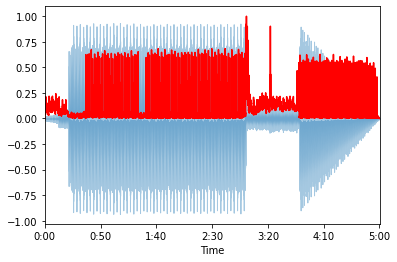

In [11]:
spectral_rolloff= librosa.feature.spectral_rolloff(x+0.01, sr=sr)[0]
librosa.display.waveplot(x, sr=sr, alpha=0.4)
plt.plot(t, normalise(spectral_rolloff), color='r')


Mel-Frequency Cepstral Coefficients

The Mel frequency cepstral coefficients (MFCCs) of a signal are a small set of features (usually about 10–20) which concisely describe the overall shape of a spectral envelope. It models the characteristics of the human voice.
Let’ work with a simple loop wave this time.

librosa.feature.mfcc computes MFCCs across an audio signal:

(20, 12928)


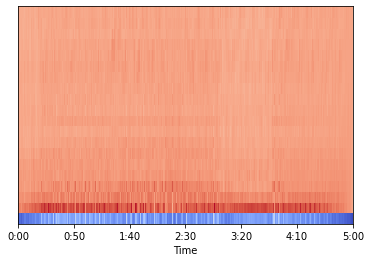

In [12]:
mfccs = librosa.feature.mfcc(x, sr=sr)
print(mfccs.shape)

#Display mfcc
librosa.display.specshow(mfccs,sr=sr, x_axis='time')

[ 9.442320e-09 -1.416348e-08  4.721160e-09  0.000000e+00  0.000000e+00
  1.888464e-08  1.888464e-08  9.442320e-09  0.000000e+00  0.000000e+00
 -2.360580e-09  9.442320e-09  1.888464e-08  9.442320e-09  0.000000e+00
 -4.721160e-09  9.442320e-09  0.000000e+00 -9.442320e-09  9.442320e-09]
[1.0000001  1.         1.0000001  1.         0.99999994 0.9999998
 1.0000001  1.0000001  0.99999994 1.         1.         0.99999994
 1.         0.99999994 1.         1.         0.9999998  1.
 1.         1.0000001 ]


/usr/local/lib/python3.7/dist-packages/sklearn/preprocessing/_data.py:236: UserWarning: Numerical issues were encountered when centering the data and might not be solved. Dataset may contain too large values. You may need to prescale your features.
  "Numerical issues were encountered "
/usr/local/lib/python3.7/dist-packages/sklearn/preprocessing/_data.py:255: UserWarning: Numerical issues were encountered when scaling the data and might not be solved. The standard deviation of the data is probably very close to 0. 
  "Numerical issues were encountered "


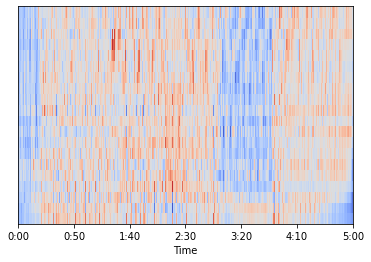

In [13]:
# Here mfcc computed 20 MFCC s over 97 frames.
# We can also perform feature scaling such that each coefficient dimension has zero mean and unit variance:

mfccs=sklearn.preprocessing.scale(mfccs, axis=1)
print(mfccs.mean(axis=1))
print(mfccs.var(axis=1))

librosa.display.specshow(mfccs, sr=sr, x_axis='time')

Chroma Frequencies

Chroma features are an interesting and powerful representation for music audio in which the entire spectrum is projected onto 12 bins representing the 12 distinct semitones (or chroma) of the musical octave.
librosa.feature.chroma_stft is used for computation

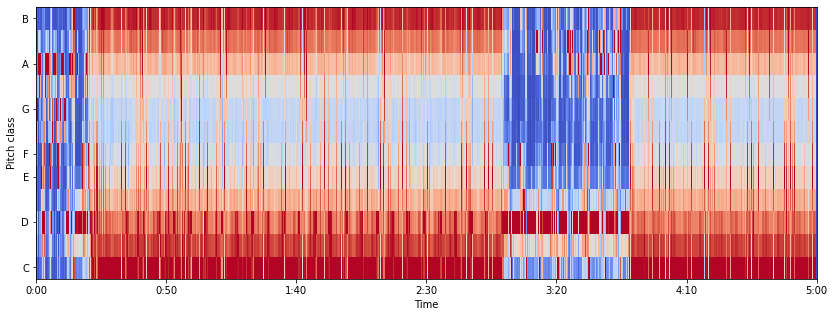

In [14]:
hop_length=1024
chromagram = librosa.feature.chroma_stft(x, sr=sr, hop_length=hop_length)
plt.figure(figsize=(14,5))
librosa.display.specshow(chromagram, x_axis="time", y_axis='chroma', hop_length=hop_length, cmap='coolwarm')

Creating an audio signal

Let us now create an audio signal at 220Hz. An audio signal is a numpy array, so we shall create one and pass it into the audio function.

In [15]:
sr = 22050 #sample rate
T = 5.0 #seconds
squeek_meter=5 #(you can change this variable to a higher value to make it sound more "high")
t= np.linspace(0, T, int(T*sr), endpoint=False) # time variable
x = 0.5*np.sin(squeek_meter*np.pi*220*t)# pure sinusoid wave at 220HZ

#Playing the audio
ipd.Audio(x,rate=sr)

#To save audio
#librosa.output.write_wave('Some_song_name.wav', x, sr)